##Ejercicio 1: Espacios de Color

Usando una imagen a color de su elección:

a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado.

b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio.

c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión.

##Ejercicio 2: Muestreo y Cuantización


a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8.

b) Para cada caso, calcular:
El nuevo tamaño de la imagen
El porcentaje de reducción de datos

c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)

d) ¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?

##Ejercicio 3: Segmentación por Color


Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB.

b) Calcular y mostrar el histograma de la imagen en escala de grises.

c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado.

d) Dibujar los bordes del objeto segmentado en color rojo.

# Análisis de Espacios de Color con OpenCV

## 1. Introducción a los Espacios de Color

Las imágenes digitales a color se pueden representar de diferentes maneras. Los dos espacios de color más comunes en procesamiento digital de imágenes son:

RGB (Red, Green, Blue):
- Usado por la mayoría de dispositivos de visualización
- Cada pixel se representa con 3 valores (Rojo, Verde, Azul)
- Valores típicos entre 0-255 por canal

BGR (Blue, Green, Red):
- Formato utilizado por OpenCV
- Misma estructura que RGB pero con orden invertido
- Importante para evitar errores de interpretación


In [88]:
## Instalamos bibliotecas necesarias
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from cv2 import imread
#import math
from cv2 import imread, cvtColor, COLOR_BGR2RGB
from sklearn.cluster import KMeans


Instale gdown dado que de la url original, arrojaba error con !wget, por eso opte instalar gdown, posteriormente descargue la imagen y subi a mi drive compartiendo el archivo

In [2]:
!pip install gdown

##Descarga de la imagen

In [3]:
import gdown

url = "https://drive.google.com/uc?id=1WQsqiUy7oUQj7-JGXwNS8QhXLcPLEBDg"
output = "paisaje.jpeg"
gdown.download(url, output, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1WQsqiUy7oUQj7-JGXwNS8QhXLcPLEBDg
To: /content/paisaje.jpeg
100%|██████████| 1.28M/1.28M [00:00<00:00, 72.7MB/s]


'paisaje.jpeg'

In [4]:
# Función para analizar características de la imagen
def info_img(img):
    print('tamaño =', img.shape)
    print('máximo =', np.max(img))
    print('mínimo =', np.min(img))
    print("Tamaño en memoria (bytes):", imagen_bgr.nbytes)

##Trabajando con OpenCV (cv2)

OpenCV es una biblioteca para el procesamiento de imágenes:
- Utiliza formato BGR por defecto


In [5]:
imagen_bgr = cv2.imread('paisaje.jpeg')
print(type(imagen_bgr))

<class 'numpy.ndarray'>


In [ ]:
# Visualización de la imagen completa
cv2_imshow(imagen_bgr)
info_img(imagen_bgr)

Redimensione la imagen (512 x 512) dado que es un poco grande y con esto trato de evitar problemas de:

_ Tiempo de procesamiento

_ Visualización lenta

_ Uso innecesario de memoria

_ Dificultad para comparar imagenes en distintos canales dado su tamaño

In [8]:
imagen_bgr = cv2.resize(imagen_bgr, (512, 512))
print("Dimensiones de la imagen:", imagen_bgr.shape)
print("Tipo de datos:", imagen_bgr.dtype)
print("Tamaño en memoria (bytes):", imagen_bgr.nbytes)

Dimensiones de la imagen: (512, 512, 3)
Tipo de datos: uint8
Tamaño en memoria (bytes): 786432


# Visualización de la imagen completa (en formato BGR)


Imagen original en formato BGR:


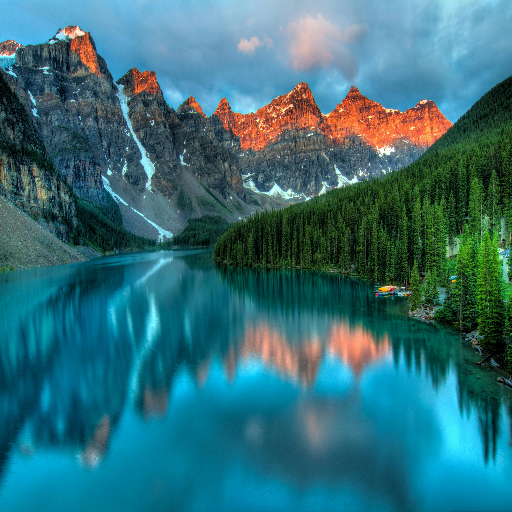

tamaño = (512, 512, 3)
máximo = 255
mínimo = 0
Tamaño en memoria (bytes): 786432


In [10]:
print("\nImagen original en formato BGR:")
cv2_imshow(imagen_bgr)
info_img(imagen_bgr)

## Análisis de Canales BGR por separado

Cada canal representa la intensidad de un color específico:
- Valores cercanos a 0 indican ausencia del color
- Valores cercanos a 255 indican máxima intensidad


 a) Separar canales y mostrarlos individualmente
  - Canal Azul (B)

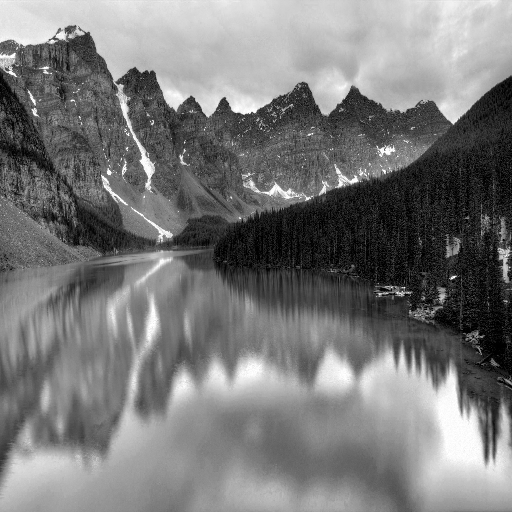


Canal Azul (B):
Valor mínimo: 0, Valor máximo: 255, Promedio: 120.91


In [17]:
B = imagen_bgr[:,:,0]
cv2_imshow(B)
print("\nCanal Azul (B):")
print(f"Valor mínimo: {B.min()}, Valor máximo: {B.max()}, Promedio: {B.mean():.2f}")

# Canal Verde (G)


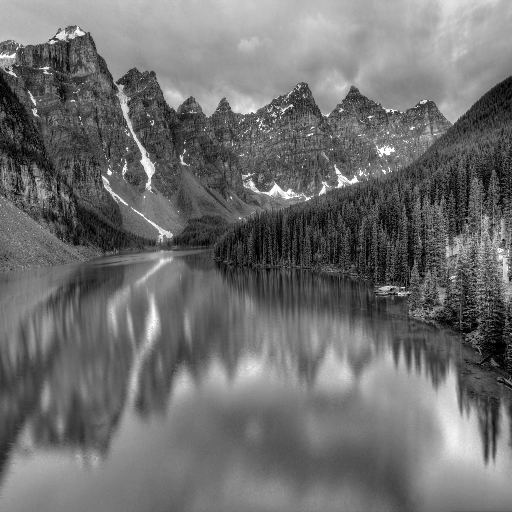


Canal Verde (G):
Valor mínimo: 0, Valor máximo: 255, Promedio: 111.14


In [19]:
G = imagen_bgr[:,:,1]
cv2_imshow(G)
print("\nCanal Verde (G):")
print(f"Valor mínimo: {G.min()}, Valor máximo: {G.max()}, Promedio: {G.mean():.2f}")


# Canal Rojo (R)

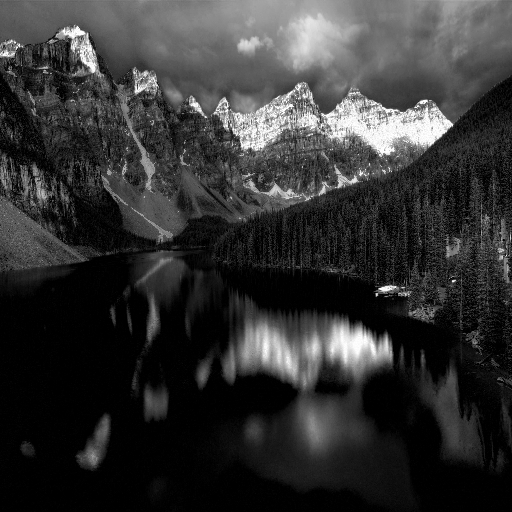


Canal Rojo (R):
Valor mínimo: 0, Valor máximo: 255, Promedio: 51.24


In [21]:
R = imagen_bgr[:,:,2]
cv2_imshow(R)
print("\nCanal Rojo (R):")
print(f"Valor mínimo: {R.min()}, Valor máximo: {R.max()}, Promedio: {R.mean():.2f}")

# Visualización usando matplotlib para mayor detalle

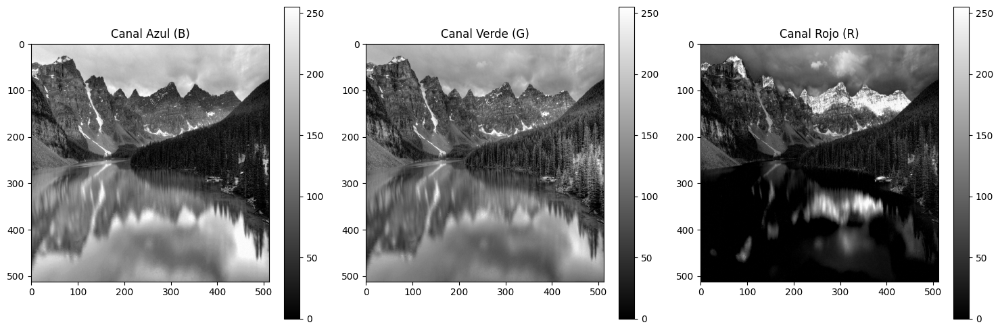

In [22]:

plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.imshow(B, cmap='gray')
plt.title('Canal Azul (B)')
plt.colorbar()

plt.subplot(132)
plt.imshow(G, cmap='gray')
plt.title('Canal Verde (G)')
plt.colorbar()

plt.subplot(133)
plt.imshow(R, cmap='gray')
plt.title('Canal Rojo (R)')
plt.colorbar()

plt.tight_layout()
plt.show()

## Se identifica el canal con mayor información

- b) Identificar cuál de los tres canales tiene mayor información basándose en valores promedio



In [23]:
print("\nAnálisis de valores promedio:")
print(f"Valor promedio del canal Azul (B): {B.mean():.2f}")
print(f"Valor promedio del canal Verde (G): {G.mean():.2f}")
print(f"Valor promedio del canal Rojo (R): {R.mean():.2f}")

# Determinar el canal con mayor información
valores_promedio = [B.mean(), G.mean(), R.mean()]
canales = ['Azul (B)', 'Verde (G)', 'Rojo (R)']
canal_max = canales[valores_promedio.index(max(valores_promedio))]

print(f"\nEl canal con mayor información basado en el valor promedio es: {canal_max}")



Análisis de valores promedio:
Valor promedio del canal Azul (B): 120.91
Valor promedio del canal Verde (G): 111.14
Valor promedio del canal Rojo (R): 51.24

El canal con mayor información basado en el valor promedio es: Azul (B)


# Visualización de histogramas para cada canal


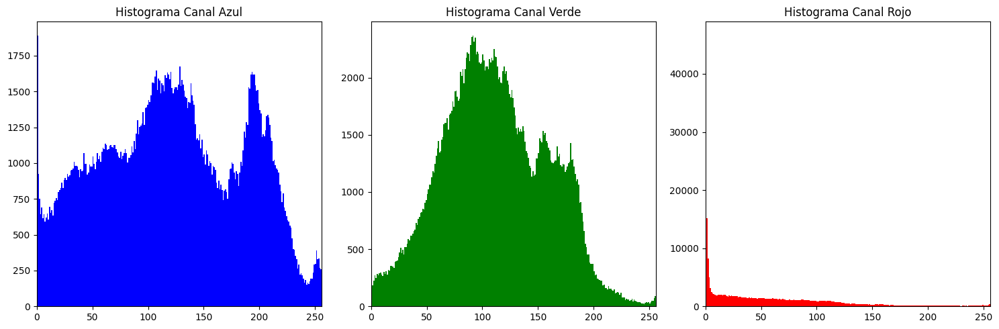

In [24]:
plt.figure(figsize=(15, 5))

plt.subplot(131)
plt.hist(np.ravel(B), bins=256, range=(0, 256), color='blue')
plt.title('Histograma Canal Azul')
plt.xlim([0, 256])

plt.subplot(132)
plt.hist(np.ravel(G), bins=256, range=(0, 256), color='green')
plt.title('Histograma Canal Verde')
plt.xlim([0, 256])

plt.subplot(133)
plt.hist(np.ravel(R), bins=256, range=(0, 256), color='red')
plt.title('Histograma Canal Rojo')
plt.xlim([0, 256])

plt.tight_layout()
plt.show()


#  Análisis de Histograma por Canal de Color (Paisaje)

Se analiza cada uno de los canales de color **BGR (Blue, Green, Red)** de la imagen, comparando la información visual con los resultados de su histograma.

---

### 🔵 Canal Azul (Blue)

#### 📈 Histograma:
- Picos altos entre valores de **50 a 200** y algunas caidas en 175.
- Distribución amplia en toda la gama (de tonos oscuros a claros).

#### 🖼️ Imagen:
- Dominio claro del **color turquesa en el lago**.
- Reflejos del cielo.
- Sombra azulada en árboles y deshielo de las montañas.

####  Conclusión:
> El canal azul es **el más dominante** en la imagen, lo cual observa en el histograma.

---

### 🟢 Canal Verde (Green)

#### 📈 Histograma:
- Pico importante en la zona media (entre **80 y 130**).
- Disminución progresiva después de los 150 con algunos picos.

#### 🖼️ Imagen:
- Gran presencia de **vegetación (árboles de pino)** en el paisaje.
- Parte del agua también contiene tonos verdosos al mezclarse con el azul.

####  Conclusión:
> El canal verde representa la **vegetación del entorno**. Aunque no tan dominante como el azul, sigue siendo muy importante.

---

### 🔴 Canal Rojo (Red)

#### 📈 Histograma:
- Intensidad baja.
- Valores concentrados cerca de **0 a 50**.

#### 🖼️ Imagen:
- El rojo aparece **sólo en los picos de las montañas**, iluminadas por el sol durante el atardecer/amanecer.
- Algo pequeño en comparación al resto del paisaje.

####  Conclusión:
> El canal rojo tiene **baja presencia**, lo cual se observa en el histograma.



##Uso de Matplotlib (RGB)

Matplotlib ofrece funcionalidades más avanzadas de visualización:
- Usa formato RGB por defecto
- Permite personalización detallada de gráficos
- Ideal para presentación y análisis visual

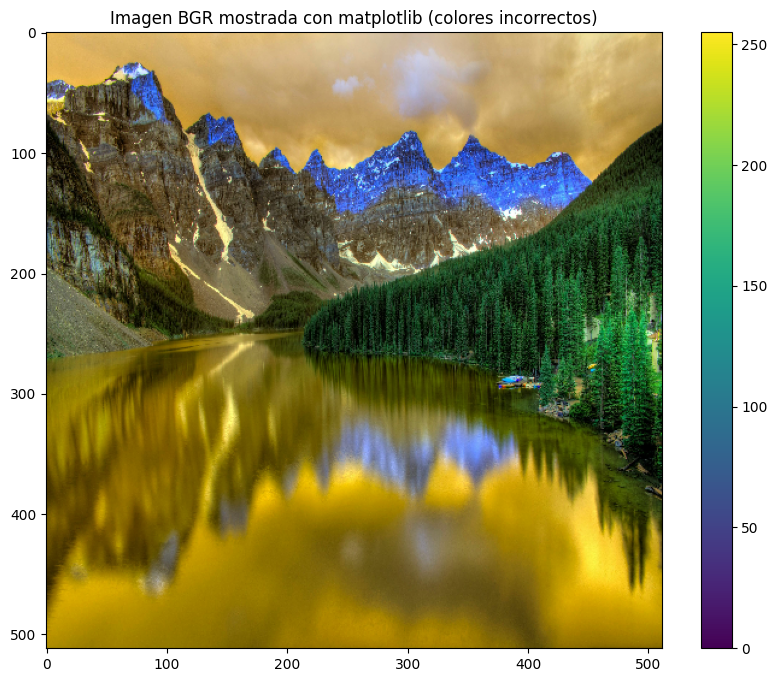

In [25]:
# Visualización de la imagen usando matplotlib (que espera formato RGB)
plt.figure(figsize=(10, 8))
plt.imshow(imagen_bgr)  # Nota: esto mostrará colores incorrectos, ya que matplotlib espera RGB
plt.title('Imagen BGR mostrada con matplotlib (colores incorrectos)')
plt.colorbar()
plt.show()

## 7. Conversión entre Espacios de Color


Es crucial entender cómo convertir entre BGR y RGB:
- Evita errores de interpretación
- Permite usar correctamente ambas bibliotecas


 c) Convertir la imagen de BGR a RGB y explicar las diferencias

In [75]:
imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

tamaño = (2847, 4226, 3)
máximo = 255
mínimo = 0
Tamaño en memoria (bytes): 36094266


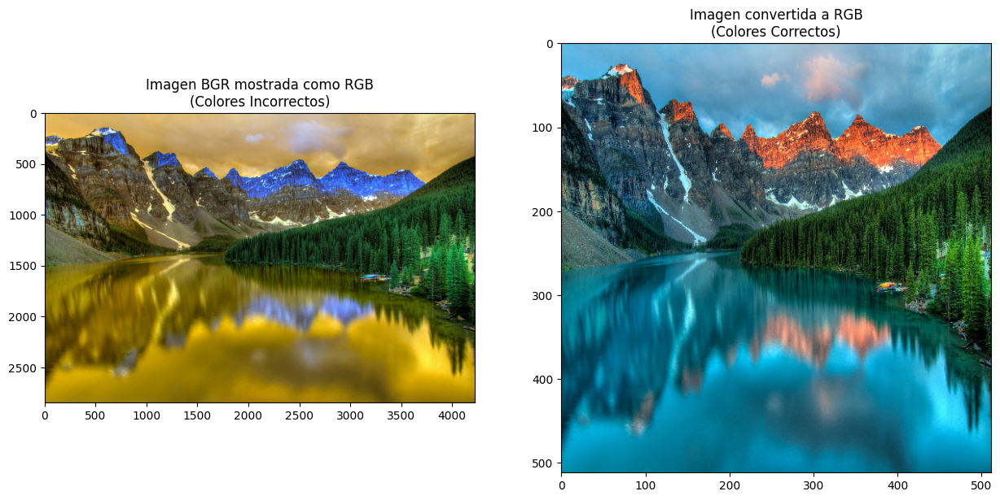

In [64]:
# Visualización comparativa
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

ax1.imshow(imagen_bgr)
ax1.set_title('Imagen BGR mostrada como RGB\n(Colores Incorrectos)')

ax2.imshow(imagen_rgb)
ax2.set_title('Imagen convertida a RGB\n(Colores Correctos)')


plt.show()


# Explicación de las diferencias


1. Orden de canales:
   - BGR (OpenCV): Blue-Green-Red
   - RGB (Matplotlib): Red-Green-Blue

2. Cuando mostramos una imagen BGR directamente con matplotlib:
   - El canal azul (B) se muestra en la posición del rojo
   - El canal verde (G) permanece en su posición
   - El canal rojo (R) se muestra en la posición del azul
   
   Esto produce una inversión de colores donde los tonos rojos aparecen azulados y viceversa.

3. La función cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB) corrige este problema:
   - Intercambia los canales R y B
   - Permite que la imagen se visualice correctamente en matplotlib

Al mostrar la imagen con matplotlib, los colores no coinciden con los reales (el cielo puede verse beige, por ejemplo).

Después de la conversión a RGB: los colores se visualizan correctamente.

La conversión BGR → RGB es necesaria para una representación visual correcta al usar bibliotecas como matplotlib.


# Visualización detallada de canales RGB

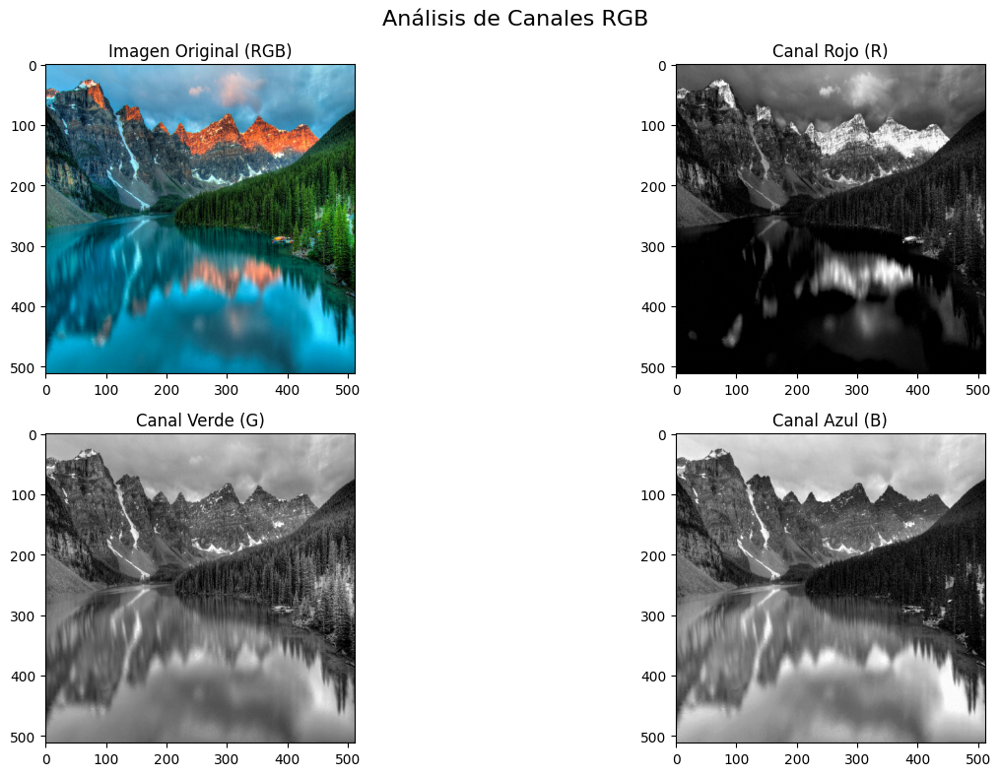

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(15, 8))
fig.suptitle('Análisis de Canales RGB', fontsize=16)

# Imagen Original (RGB correcta)
axes[0, 0].imshow(imagen_rgb)
axes[0, 0].set_title('Imagen Original (RGB)')

# Canal Rojo
axes[0, 1].imshow(imagen_rgb[:,:,0], cmap='gray')
axes[0, 1].set_title('Canal Rojo (R)')

# Canal Verde
axes[1, 0].imshow(imagen_rgb[:,:,1], cmap='gray')
axes[1, 0].set_title('Canal Verde (G)')

# Canal Azul
axes[1, 1].imshow(imagen_rgb[:,:,2], cmap='gray')
axes[1, 1].set_title('Canal Azul (B)')

plt.tight_layout()
plt.show()


## 8. Verificación de intercambio de canales

-  Comprobación de que B y R se han intercambiado


In [29]:
print("Comprobación: ¿El canal B de BGR es igual al canal R de RGB?")
print(f"Igualdad: {np.array_equal(B, imagen_rgb[:,:,2])}")

print("Comprobación: ¿El canal R de BGR es igual al canal B de RGB?")
print(f"Igualdad: {np.array_equal(R, imagen_rgb[:,:,0])}")


Comprobación: ¿El canal B de BGR es igual al canal R de RGB?
Igualdad: True
Comprobación: ¿El canal R de BGR es igual al canal B de RGB?
Igualdad: True


Al convertir una imagen de BGR a RGB con `cv2.cvtColor`, se intercambian los canales Azul y Rojo:

| Canal BGR | Canal RGB |
|-----------|------------|
| 🔵 Azul   | 🔴 Rojo    |
| 🟢 Verde  | 🟢 Verde   |
| 🔴 Rojo   | 🔵 Azul    |

#### 🔍 Comprobación realizada:
- Confirma que la conversión fue exitosa.

# Muestreo y Cuantización


#  CARGA Y VISUALIZACIÓN DE LA IMAGEN ORIGINAL
---
### Redimensión de la imagen a 512 * 512  
###Lectura de la imagen en escala de grises

In [46]:
imagen_gris = cv2.cvtColor(cv2.resize(imagen_bgr, (512, 512)), cv2.COLOR_BGR2GRAY)
print(type(imagen_gris))

<class 'numpy.ndarray'>


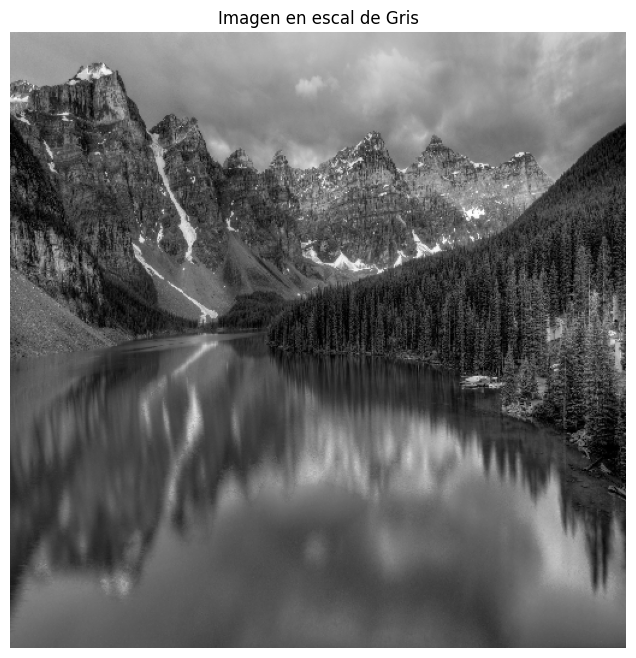

tamaño = (512, 512)
máximo = 255
mínimo = 0
Tamaño en memoria (bytes): 36094266


In [47]:
# Mostrar la imagen original en escala de grises
plt.figure(figsize=(8, 8))
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen en escal de Gris')
plt.axis('off')
plt.show()

info_img(imagen_gris)

MUESTREO ESPACIAL
-----

El muestreo espacial consiste en reducir la resolución de una imagen
tomando solo una parte de los píxeles originales.

Conceptualmente, es como colocar una cuadrícula más gruesa sobre la imagen
y seleccionar un único píxel por cada celda de la cuadrícula.

Cuando aplicamos un factor de muestreo 2, tomamos 1 de cada 2 píxeles,
tanto en filas como en columnas, reduciendo el tamaño de la imagen original.

## Funcion para reducir la resolución de la imagen original
- seleccionando solo 1 píxel cada cierta cantidad, según el factor.

- Utiliza indexación NumPy:
imagen[::factor, ::factor]

Esto selecciona según el factor usado factor = 2, entonces:

Se toma 1 de cada 2 filas → filas: 0, 2, 4, ..., 320 (aproximadamente la mitad)

Se toma 1 de cada 2 columnas → columnas: 0, 2, 4, ..., 480

In [49]:
def aplicar_muestreo(imagen, factor):
    """
    Función que implementa el muestreo espacial.

    Parámetros:
    - imagen: Imagen de entrada
    - factor: Factor de muestreo (2, 4, 8, etc.)

    Retorna:
    - imagen_muestreada: Imagen con menor resolución
    """
    return imagen[::factor, ::factor]

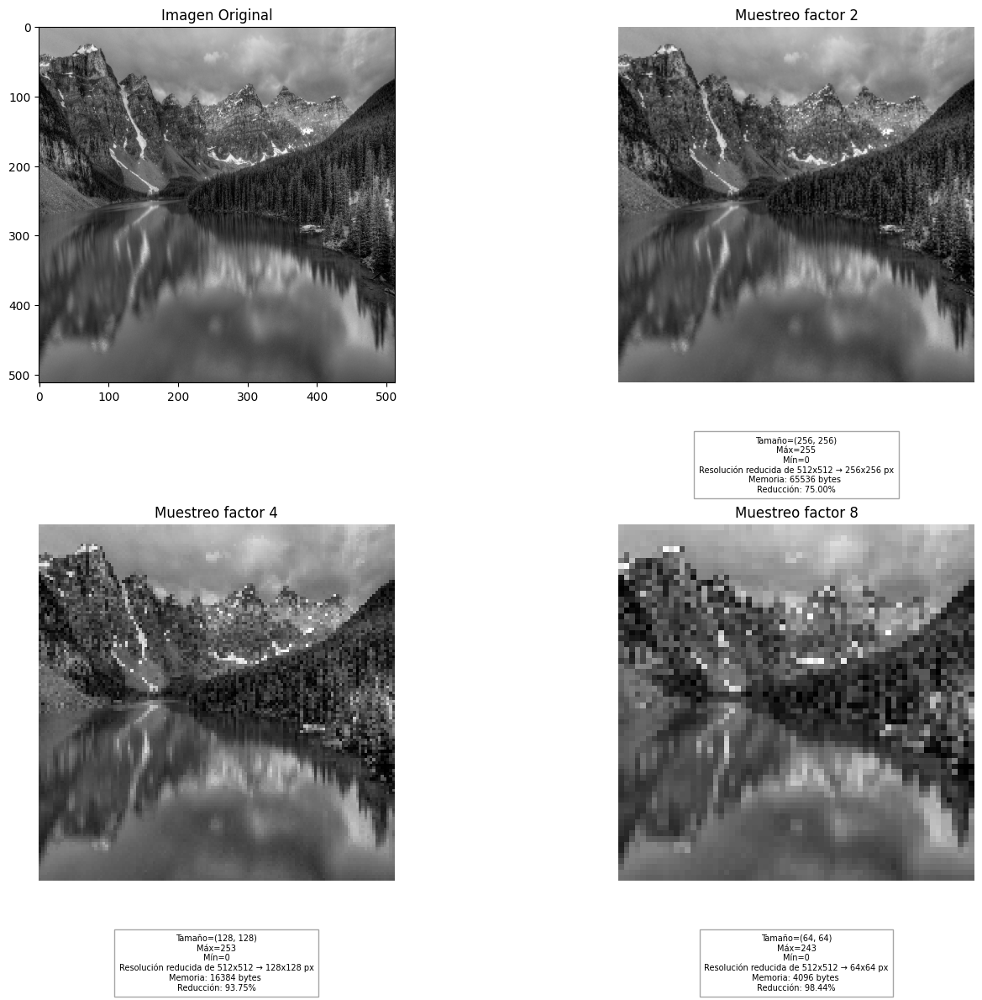

In [54]:
# Aplicamos muestreo con diferentes factores
factores = [2, 4, 8]
imagenes_muestreadas = []

# Dimensiones originales
alto_original, ancho_original = imagen_gris.shape

# Creamos una figura para mostrar la imagen original y las muestreadas
plt.figure(figsize=(15, 12))
plt.subplot(2, 2, 1)
plt.imshow(imagen_gris, cmap='gray')
plt.title('Imagen Original')
plt.axis('on')


for i, factor in enumerate(factores):
    # Aplicamos el muestreo
    imagen_muestreada = aplicar_muestreo(imagen_gris, factor)
    imagenes_muestreadas.append(imagen_muestreada)

    # Cálculos de medidas
    nuevo_alto, nuevo_ancho = imagen_muestreada.shape
    nuevo_tamano_bytes = imagen_muestreada.nbytes
    tamano_original_bytes = imagen_gris.nbytes
    porcentaje_reduccion = (1 - nuevo_tamano_bytes / tamano_original_bytes) * 100
    maximo = imagen_muestreada.max()
    minimo = imagen_muestreada.min()

    # Mostramos la imagen
    plt.subplot(2, 2, i + 2)
    plt.imshow(imagen_muestreada, cmap='gray')
    plt.axis('off')
    plt.title(f'Muestreo factor {factor}')

    # Texto informativo
    texto_info = (
        f"Tamaño=({nuevo_alto}, {nuevo_ancho})\n"
        f"Máx={maximo}\n"
        f"Mín={minimo}\n"
        f"Resolución reducida de {alto_original}x{ancho_original} → {nuevo_alto}x{nuevo_ancho} px\n"
        f"Memoria: {nuevo_tamano_bytes} bytes \n"
        f"Reducción: {porcentaje_reduccion:.2f}%"
    )

    # Insertar el texto abajo de la imagen
    plt.text(
        0.5, -0.15, texto_info,
        transform=plt.gca().transAxes,
        fontsize=7, ha='center', va='top',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='gray')
    )


plt.tight_layout()
plt.show()


### Se puede decir que en el  Muestreo Espacial:

   - Con factor 2: Reducción del 74,87% en los datos de la imagen, se puede observar una pequeña distorsion de la imagen en comparación con la original.
   - Con factor 4: Reducción del 93.75%, se observa una distorsion notoria en los picos y la vegetación pero se puede identificar o relacionar la imagen.
   - Con factor 8: Reducción del 98.44% en datos, aqui la imagen se encuentra bastante pixelada uno se puede dar una idea de que trata la imagen pero se observa bastante distorcionadas sin poder identificar los objetos que componen la imagen
   
   La pérdida de detalles se vuelve significativa con factores grandes,
   especialmente en la textura de la vegetación.


### 3. CUANTIZACIÓN
-------------

La cuantización reduce el número de niveles de intensidad en la imagen.

En una imagen de 8 bits, normalmente hay 256 niveles de gris (0-255).
Al cuantizar, agrupamos estos valores en menos niveles.

Por ejemplo, con 32 niveles, cada grupo de 8 valores consecutivos (256/32=8)
se representa con un único valor. Esto reduce la cantidad de información
y puede crear un efecto de "bandas" en áreas con
gradientes suaves como cielos o sombras.


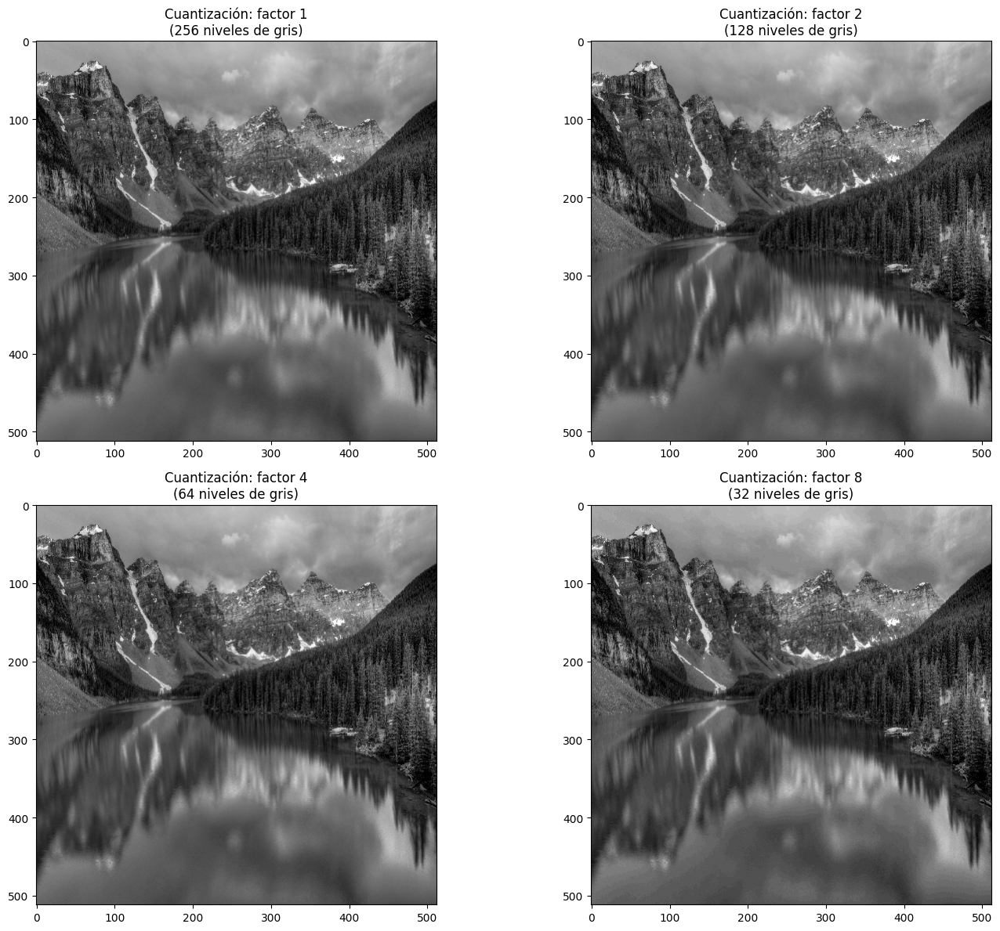

In [58]:
# Aplicamos cuantización con diferentes factores
factores_cuantizacion = [1, 2, 4, 8]  # Factores de cuantización
niveles = [int(256/q) for q in factores_cuantizacion]  # Corresponden a 256, 128, 64, 32 niveles
imagenes_cuantizadas = []

# Mostramos la imagen original y las diferentes cuantizaciones
plt.figure(figsize=(15, 12))

for i, (q, nivel) in enumerate(zip(factores_cuantizacion, niveles)):
    # Aplicamos la cuantización según el código base
    Z = np.floor(imagen_gris/q)*q  # Agrupa valores en intervalos de tamaño q
    Z = Z.astype(np.uint8)             # Convierte a enteros 0-255
    imagenes_cuantizadas.append(Z)

    # Visualizamos la imagen cuantizada
    plt.subplot(2, 2, i+1)
    plt.imshow(Z, cmap='gray')
    plt.title(f'Cuantización: factor {q}\n({nivel} niveles de gris)')
    plt.axis('on')

plt.tight_layout()
plt.show()

Imagen cuantizada (factor 1):
Esta imagen tiene 256 niveles de gris (original: 256)
Dimensiones: 512 x 512 píxeles
Valor mínimo: 0, Valor máximo: 255

Imagen cuantizada (factor 2):
Esta imagen tiene 128 niveles de gris (original: 256)
Dimensiones: 512 x 512 píxeles
Valor mínimo: 0, Valor máximo: 254

Imagen cuantizada (factor 4):
Esta imagen tiene 64 niveles de gris (original: 256)
Dimensiones: 512 x 512 píxeles
Valor mínimo: 0, Valor máximo: 252

Imagen cuantizada (factor 8):
Esta imagen tiene 32 niveles de gris (original: 256)
Dimensiones: 512 x 512 píxeles
Valor mínimo: 0, Valor máximo: 248



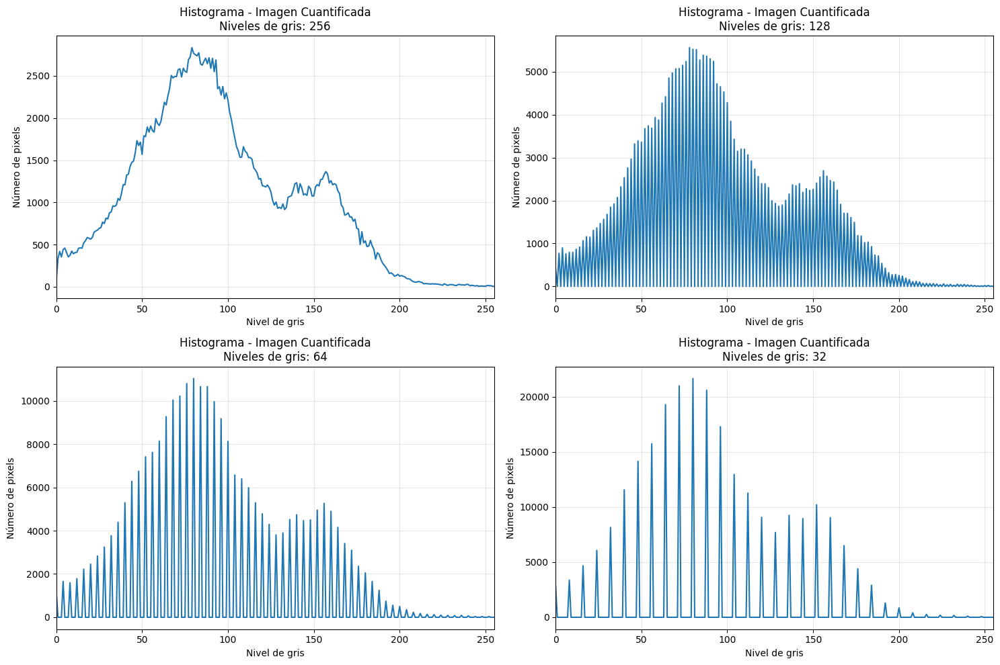

In [60]:
# Información sobre las imágenes cuantizadas
for q, nivel, img in zip(factores_cuantizacion, niveles, imagenes_cuantizadas):
    print(f"Imagen cuantizada (factor {q}):")
    print(f"Esta imagen tiene {nivel} niveles de gris (original: 256)")
    print(f"Dimensiones: {img.shape[1]} x {img.shape[0]} píxeles")
    print(f"Valor mínimo: {np.min(img)}, Valor máximo: {np.max(img)}")
    print()

# Función para calcular el histograma
def hist(img):
    h = np.zeros(256)           # Vector para contar ocurrencias
    for i in range(img.shape[0]):    # Para cada fila
        for j in range(img.shape[1]): # Para cada columna
            h[img[i,j]] += 1         # Incrementa contador del valor
    return h

# Visualizamos los histogramas de las imágenes cuantizadas
plt.figure(figsize=(15, 10))

for i, (q, nivel, img) in enumerate(zip(factores_cuantizacion, niveles, imagenes_cuantizadas)):
    plt.subplot(2, 2, i+1)
    plt.plot(hist(img))
    plt.title(f'Histograma - Imagen Cuantificada\nNiveles de gris: {nivel}')
    plt.xlabel('Nivel de gris')
    plt.ylabel('Número de pixels')
    plt.grid(True, alpha=0.3)
    plt.xlim(0, 255)

plt.tight_layout()
plt.show()


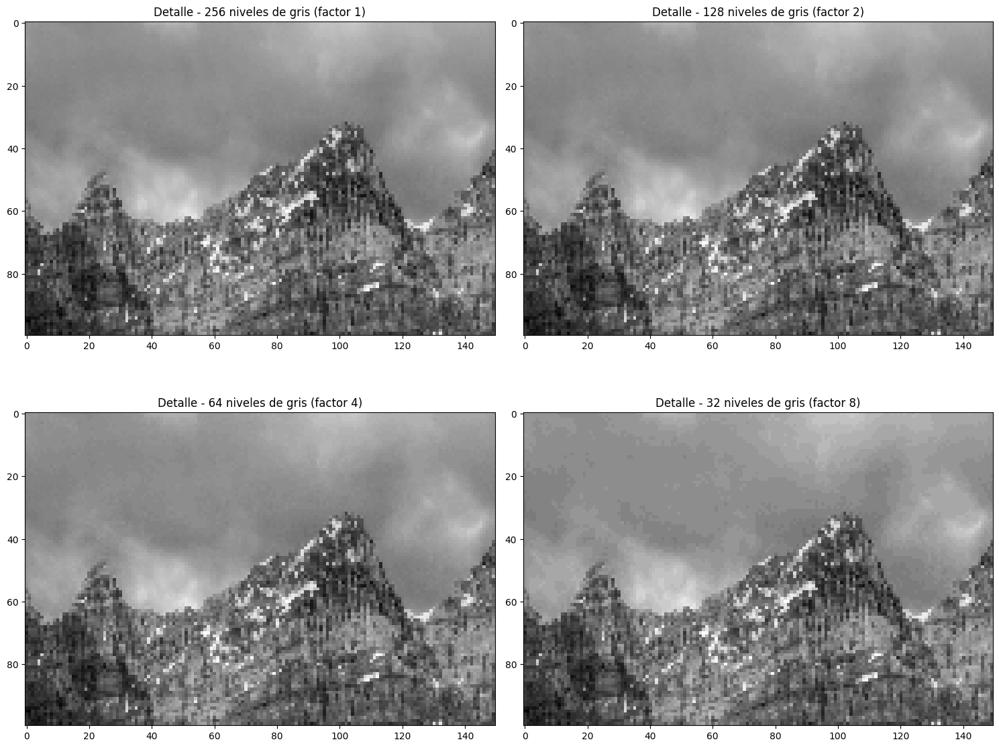

In [61]:
# Visualización detallada para analizar la degradación
# Seleccionamos una región con gradientes suaves (como el cielo)
y_inicio, x_inicio = 50, 200  # Coordenadas de la región de interés
alto_roi, ancho_roi = 100, 150  # Tamaño de la región

plt.figure(figsize=(15, 12))
for i, (q, nivel, img) in enumerate(zip(factores_cuantizacion, niveles, imagenes_cuantizadas)):
    # Extraemos la región de interés
    roi = img[y_inicio:y_inicio+alto_roi, x_inicio:x_inicio+ancho_roi]

    # Mostramos la ROI ampliada
    plt.subplot(2, 2, i+1)
    plt.imshow(roi, cmap='gray')
    plt.title(f'Detalle - {nivel} niveles de gris (factor {q})')

plt.tight_layout()
plt.show()

### Análisis y Conclusión

ANÁLISIS DE LA CUANTIZACIÓN:

La cuantización reduce la profundidad de bits de una imagen, agrupando valores
de intensidad cercanos en un mismo nivel.

Observaciones:
1. Con 256 niveles (q=1): No hay pérdida, es la imagen original de 8 bits.
2. Con 128 niveles (q=2): La degradación es mínima y apenas perceptible.
3. Con 64 niveles (q=4): Comienzan a aparecer contornos falsos o "bandas"
   en áreas con gradientes suaves como el cielo.
4. Con 32 niveles (q=8): El efecto de posterización es claramente visible.

En los histogramas podemos observar:
- A mayor factor de cuantización, el histograma tiene menos barras ocupadas
  y están más separadas entre sí.
- Los "picos" en el histograma representan los únicos valores permitidos
  en la imagen cuantizada.

CONCLUSIÓN:
La degradación por cuantización comienza a ser visualmente perceptible
cuando se reduce a 64 niveles o menos (factor q=4 o mayor). Este efecto
es especialmente notable en áreas con gradientes suaves como el cielo,
donde aparecen bandas o contornos falsos.

La inspección visual de los histogramas confirma esta observación,
mostrando una separación muy marcada entre los valores de intensidad
cuando tenemos 64 niveles o menos.

* Profundidad de bits: Número de niveles de gris posibles (8 bits = 256 niveles)
* Cuantización: Proceso de reducir la profundidad de bits de una imagen
* Posterización: Efecto visual de "bandas" que ocurre cuando hay pocos
  niveles de gris (cuantización grande)
* Error de cuantización: Diferencia entre la imagen original y la cuantizada

##Ejercicio 3: Segmentación por Color

In [69]:
# Función para segmentar automáticamente según el color dominante en RGB
def segmentacion_color_dominante(img_rgb, k=3):
    pixels = img_rgb.reshape(-1, 3)
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(pixels)
    centros = kmeans.cluster_centers_
    suma_rgb = centros.sum(axis=0)
    canal_dominante = np.argmax(suma_rgb)
    nombres = ['Rojo', 'Verde', 'Azul']
    print(f"Canal dominante detectado: {nombres[canal_dominante]}")
    umbral_min = np.min(centros[:, canal_dominante]) - 30
    umbral_max = np.max(centros[:, canal_dominante]) + 30
    umbral_min = np.clip(umbral_min, 0, 255)
    umbral_max = np.clip(umbral_max, 0, 255)
    R = img_rgb[:, :, 0]
    G = img_rgb[:, :, 1]
    B = img_rgb[:, :, 2]
    if canal_dominante == 0:
        seg = np.logical_and(R > umbral_min, R < umbral_max)
        seg = np.logical_and(seg, G < 100)
        seg = np.logical_and(seg, B < 100)
    elif canal_dominante == 1:
        seg = np.logical_and(G > umbral_min, G < umbral_max)
        seg = np.logical_and(seg, R < 100)
        seg = np.logical_and(seg, B < 100)
    else:
        seg = np.logical_and(B > umbral_min, B < umbral_max)
        seg = np.logical_and(seg, R < 100)
        seg = np.logical_and(seg, G < 100)
    return seg

## Redimensión de la imagen para una mejor visualización y proceso

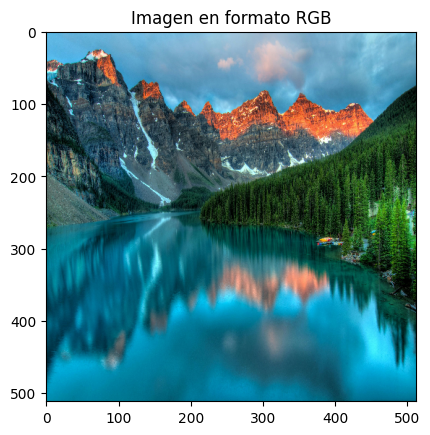

tamaño = (512, 512, 3)
máximo = 255
mínimo = 0
Tamaño en memoria (bytes): 36094266


In [81]:
imagen_rgb = cv2.resize(imagen_rgb, (512, 512))
plt.imshow(imagen_rgb)
plt.title('Imagen en formato RGB')
plt.show()
info_img(imagen_rgb)


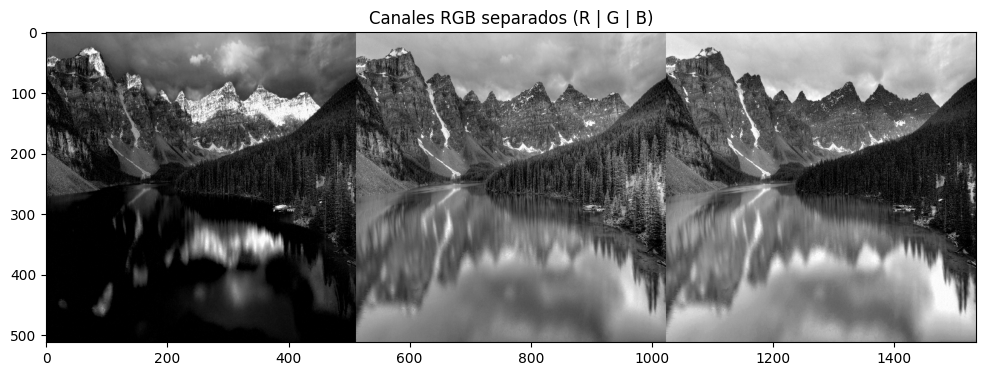

In [82]:
# Separación de canales de color
rojo = imagen_rgb[:,:,0]
verde = imagen_rgb[:,:,1]
azul = imagen_rgb[:,:,2]
canales = np.concatenate((rojo,verde,azul),axis=1)
plt.figure(figsize=(12, 8))
plt.imshow(canales, cmap='gray')
plt.title('Canales RGB separados (R | G | B)')
plt.show()

# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)

Pesos para percepción humana (0.299, 0.587, 0.114):

Este método, conocido como la fórmula de luminancia, está basado en la sensibilidad del ojo humano.
El ojo humano es más sensible al verde, menos al rojo, y mucho menos al azul.
Los pesos están calibrados según la respuesta del sistema visual humano.

Fórmula: gris = 0.299 * R + 0.587 * G + 0.114*B

La diferencia visual es que las imágenes convertidas con los pesos de percepción humana se ven más naturales y preservan mejor los detalles que son importantes para nuestra visión.
Para el ejercicio de segmentación, usar los pesos de percepción humana puede proporcionar una escala de grises que preserva mejor los contrastes importantes para la detección de bordes y características.

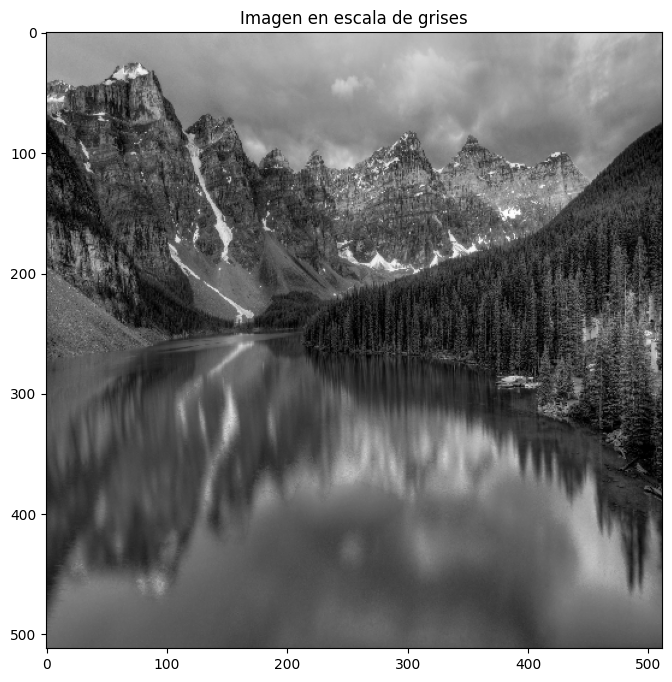

tamaño = (512, 512)
máximo = 254
mínimo = 0
Tamaño en memoria (bytes): 36094266


In [86]:
# Promedio ponderado estándar para percepción humana
peso = (0.299, 0.587, 0.114)  # Pesos estándar para mejor percepción
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(np.uint8)  # Usar uint8 para mantener rango 0-255
plt.figure(figsize=(10, 8))
plt.imshow(gris,cmap='gray')
plt.title('Imagen en escala de grises')
plt.show()
info_img(gris)

# Función para mostrar histograma
def histograma(X):
    plt.figure(figsize=(10, 6))
    n, bins, patches = plt.hist(X.flatten(), bins=256,
                       range=[0, 256], histtype='step', linewidth=1.5)
    plt.title('Histograma')
    plt.xlabel('Valor de pixel')
    plt.ylabel('Frecuencia')
    plt.grid(False)
    plt.show()



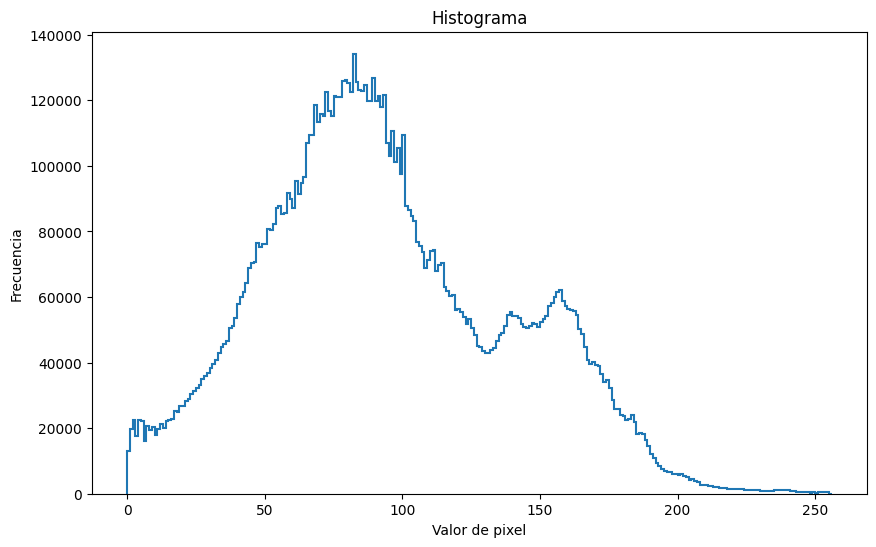

In [79]:
histograma(gris)

Canal dominante detectado: Azul


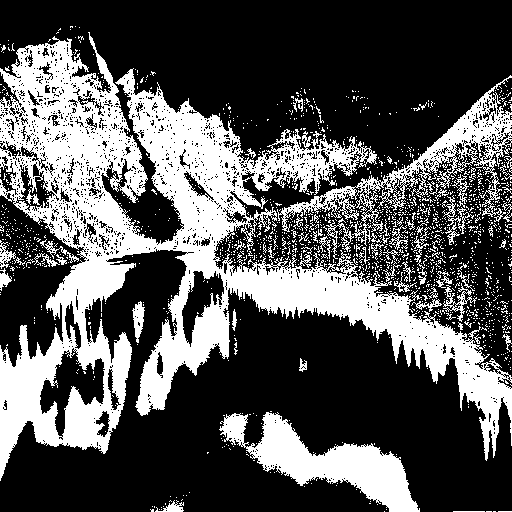

In [89]:
# Segmentación automática por color dominante
seg = segmentacion_color_dominante(imagen_rgb)
cv2_imshow(seg.astype(np.uint8)*255)

In [91]:
# Convertir de bool a uint8
seg_uint8 = (seg.astype(np.uint8)) * 255  # 0 o 255

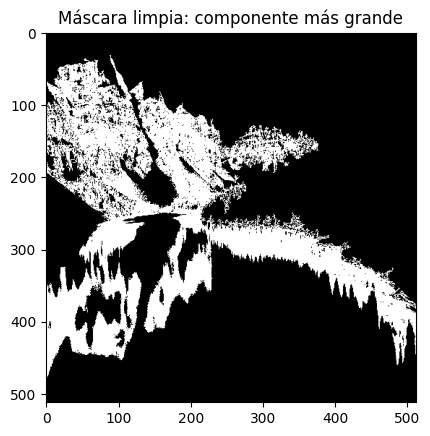

In [92]:
(N, M) = seg_uint8.shape

# --- Limpieza usando componentes conectados ---
# Asegurarse que la máscara sea binaria (0 y 255)
_, binary_mask = cv2.threshold(seg_uint8, 0, 255, cv2.THRESH_BINARY)

# Buscar componentes conectados
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary_mask)

# stats[1:, 4] son las áreas de cada componente (ignoramos el fondo [0])
areas = stats[1:, cv2.CC_STAT_AREA]
max_idx = 1 + np.argmax(areas)  # Índice del componente más grande (no fondo)

# Crear nueva máscara solo con el objeto más grande
limpia = np.where(labels == max_idx, 255, 0).astype(np.uint8)

# Mostrar máscara limpia
plt.imshow(limpia, cmap='gray')
plt.title('Máscara limpia: componente más grande')
plt.show()


Coordenadas del rectángulo:
Superior izquierda: (0, 32)
Superior derecha: (511, 32)
Inferior izquierda: (0, 480)
Inferior derecha: (511, 480)


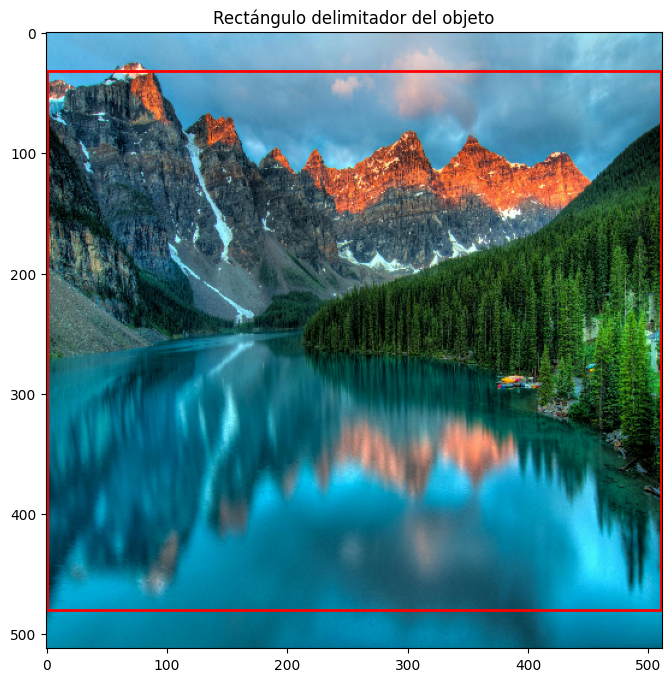

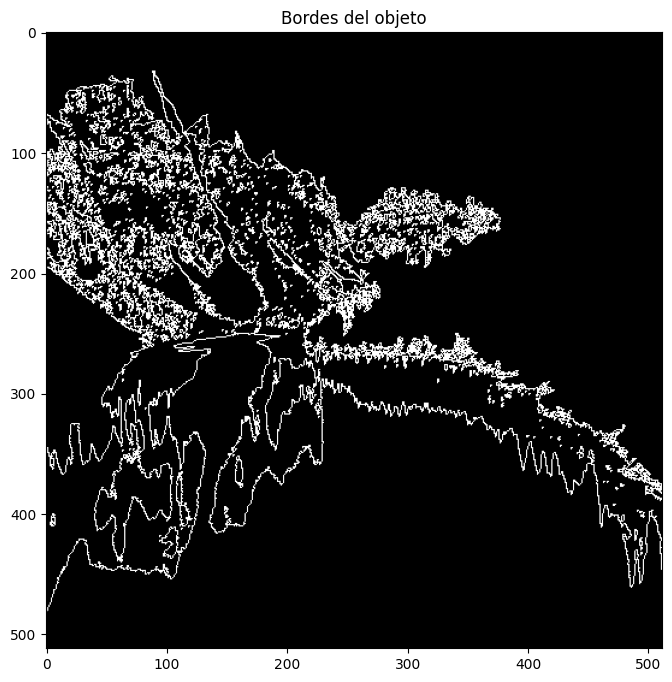

Imagen final con bordes del objeto destacados en azul.


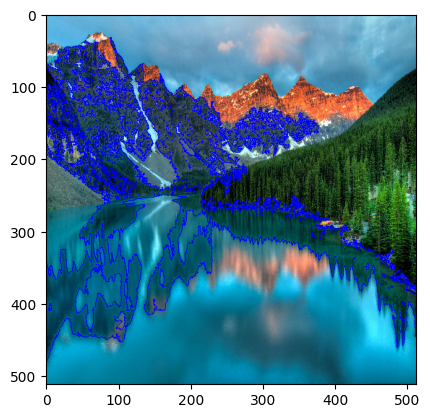

In [94]:
## --- Búsqueda de coordenadas del rectángulo ---
i_min = N
i_max = 0
j_min = M
j_max = 0

for i in range(N):
    for j in range(M):
        if limpia[i,j] > 0:
            if i < i_min: i_min = i
            if i > i_max: i_max = i
            if j < j_min: j_min = j
            if j > j_max: j_max = j

print(f"Coordenadas del rectángulo:")
print(f"Superior izquierda: ({j_min}, {i_min})")
print(f"Superior derecha: ({j_max}, {i_min})")
print(f"Inferior izquierda: ({j_min}, {i_max})")
print(f"Inferior derecha: ({j_max}, {i_max})")

if i_min == N or j_min == M or i_max == 0 or j_max == 0:
    print("¡ADVERTENCIA! No se detectaron coordenadas válidas para el objeto.")
else:
    plt.figure(figsize=(8, 8))
    plt.imshow(imagen_rgb)
    y = [i_min, i_min, i_max, i_max, i_min]
    x = [j_min, j_max, j_max, j_min, j_min]
    plt.plot(x, y, 'r-', linewidth=2)
    plt.title('Rectángulo delimitador del objeto')
    plt.show()

    # --- Detección de bordes ---
    borde = np.zeros((N, M), np.uint8)

    for i in range(N):
        for j in range(1, M):
            if limpia[i,j] != limpia[i,j-1]:
                borde[i,j] = 1

    for i in range(1, N):
        for j in range(M):
            if limpia[i-1,j] != limpia[i,j]:
                borde[i,j] = 1

    plt.figure(figsize=(8, 8))
    plt.imshow(borde, cmap='gray')
    plt.title('Bordes del objeto')
    plt.show()

    # --- Dibujo final sobre la imagen original (RGB)---
    img_final = imagen_rgb.copy()
    for i in range(N):
        for j in range(M):
            if borde[i,j] == 1:
                img_final[i,j] = [0, 0, 255]  # AZUL en RGB

    plt.imshow(img_final)
    print("Imagen final con bordes del objeto destacados en azul.")